<div style="width: 100%; clear: both;">
<div style="float: left; width: 50%;">
<img src="http://www.uoc.edu/portal/_resources/common/imatges/marca_UOC/UOC_Masterbrand.jpg", align="left">
</div>
<div style="float: right; width: 50%;">
<p style="margin: 0; padding-top: 22px; text-align:right;">M2.859 · Visualización de datos </p>
<p style="margin: 0; text-align:right;">Máster universitario en Ciencia de datos (<i>Data science</i>)</p>
<p style="margin: 0; text-align:right; padding-button: 100px;">Estudios de Informática, Multimedia y Telecomunicación</p>
</div>
</div>
<div style="width:100%;">&nbsp;</div>


<div class="row" style="background: #FCB517;padding: 10px 20px;">
    <div class="col-md-6">
        <div style="text-align:center;"> </div>
    </div>
</div>


<div class="container-fluid main-container">
    <div class="fluid-row" id="header">
        <hr />
        <hr />
        <hr />
            <h1 class="title toc-ignore">Práctica 2: Creación de la visualización y entrega del proyecto</h1>
            <h4 class="author">Agustin Rovira Quezada</h4>
        <hr />
        <hr />
        <hr />
    </div>

<div id="TOC">
<ul>
<li><a href="#funciones"><span class="toc-section-number">0</span> Funciones y librerias</a></li>
<li><a href="#introducción"><span class="toc-section-number">1</span> Introduccion</a></li>
<li><a href="#enunciado"><span class="toc-section-number">2</span> Integración y selección</a></li>
<li><a href="#Preguntas"><span class="toc-section-number">3</span> ¿Preguntas responde la visualización de datos?</a><ul>
<li><a href="#Preguntas-31"><span class="toc-section-number">3.1</span> Economico: Wage y Value</a></li>
<li><a href="#Preguntas-32"><span class="toc-section-number">3.2</span> Atributos</a></li>
<li><a href="#Preguntas-33"><span class="toc-section-number">3.3</span> Edad y potencial: Age vs Score</a></li>
<li><a href="#Preguntas-34"><span class="toc-section-number">3.3</span> Versatilidad</a></li>
</ul></li>
<li><a href="#Pregunta4"><span class="toc-section-number">4.</span> Equipo Final</a></li>
</ul>
</div>
</div>

<div id="funciones" class="section level1">
<h1><span class="header-section-number">0.</span> Funciones y librerias</h1>
<hr />
Se cargan todas las librerias necesarias para el analisis de datos exploratorios. Por otro lado se definen las funciones necesarias para la creacion de las visualizaciones
<hr />
</div>

#### Librerias

In [1]:
import pandas as pd
import numpy as np
import itertools
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from scipy import stats
import itertools 
import matplotlib.gridspec as gridspec
import scipy.stats as stats
from matplotlib.cm import get_cmap
import re
import io
import plotly.io as pio

#### Constantes

In [2]:
Atribute={
    "Pace":[['Sprint speed',"Acceleration"],[0.55,0.45]]
    ,"Shooting":[['Finishing','Long shots','Shot power','Volleys','Positioning','Penalties','Composure'],[0.40, 0.15, 0.15, 0.05, 0.05, 0.05,0.15]]
    ,"Passing":[['Short passing','Crossing','Vision','Long passing', 'Curve','Free kick accuracy','Composure'],[0.30, 0.15, 0.15, 0.15,0.05,0.05,0.15]]
    ,"Dribblin":[['Dribbling', 'Ball control','Agility','Balance','Reactions'],[0.40, 0.30, 0.10, 0.05,0.15]]
    ,"Defending":[['Standing tackle','Marking','Interceptions','Heading accuracy','Sliding tackle'],[0.30,0.30,0.20,0.10,0.10]]
    ,"Physical":[['Strength','Stamina','Aggression','Jumping'],[0.50, 0.25, 0.20, 0.05]]
    ,"GoolKeeper":[['GK diving','GK handling','GK kicking','GK positioning','GK reflexes'],[0.20, 0.20, 0.20, 0.20, 0.20]]
}

Positions={ 
    "Attackers":['ST', 'LW', 'RW','CF',"RS","LF","LS"]
    ,"Midfielders":['CAM', 'LM', 'CM', 'RM', 'CDM',"RAM","RF","LAM","LCM","LW"]
    ,"Defenders":['LWB', 'RWB', 'LB', 'CB', 'RB',"RDM","RCM","RCB","LB","LCB","LDM","LM","LWB"]   
    ,"GoolKeeper":["GK"]
}

Positions2={i:key for key,value in Positions.items() for i in value}

#### Funciones

In [3]:
####################################### Carga y Procesamiento del dataset #######################################
def LoadDataset(titulo):
    '''
        Input.
            -Titulo: String con el path del archivo a cargar
        Output:
            -Dataframe 
    '''
    cols=["Name","Age","Nationality","Overall","Potential","Club","Value","Wage","Special","Acceleration","Aggression","Agility","Balance","Ball control","Composure","Crossing","Curve","Dribbling","Finishing","Free kick accuracy","GK diving","GK handling","GK kicking","GK positioning","GK reflexes","Heading accuracy","Interceptions","Jumping","Long passing","Long shots","Marking","Penalties","Positioning","Reactions","Short passing","Shot power","Sliding tackle","Sprint speed","Stamina","Standing tackle","Strength","Vision","Volleys","CAM","CB","CDM","CF","CM","ID","LAM","LB","LCB","LCM","LDM","LF","LM","LS","LW","LWB","Preferred Positions","RAM","RB","RCB","RCM","RDM","RF","RM","RS","RW","RWB","ST"]
    return pd.read_csv(titulo,usecols=cols,low_memory=False)

def descr(df):
    '''
        Input.
            -df: Dataframe. Normal dataframe
        Output:
            -info: Dataframe with the description of each variable 
    '''
    buf = io.StringIO()
    df.info(buf=buf)
    s = buf.getvalue()
    lines = [line.split() for line in s.splitlines()[5:-2]]
    info=pd.DataFrame(lines)
    info.columns=['#', 'Column', 'Non-Null', 'Count', 'Dtype',"non","non2"]
    info.drop(['#',"non","non2",'Count', 'Non-Null'], axis=1,inplace=True)
    return info

def combine_positions(df):
    '''
        This function combine the field position's score into 3 categories Attackers,Midfielders,Defenders.
        The process is the unweighted mean of the scores for the positions belonging to the corresponding category
        
        Input.
            -df: Dataframe. Normal dataframe
        Output:
            -info: Dataframe with new columns 
    '''
    df["Attackers"]=df[['ST', 'LW', 'RW','CF',"RS","LF","LS"]].mean(axis=1)
    df["Midfielders"]=df[['CAM', 'LM', 'CM', 'RM', 'CDM',"RAM","RF","LAM","LCM","LW"]].mean(axis=1)
    df["Defenders"]=df[['LWB', 'RWB', 'LB', 'CB', 'RB',"RDM","RCM","RCB","LB","LCB","LDM","LM","LWB"]].mean(axis=1)    
    cam=['ST',"RM",'LW', 'RW','CF','CAM', 'LM', 'CM', 'RM', 'CDM','LWB', 'RWB', 'LB',
         'CB', 'RB',"RAM","RS","RF","RDM","RCM","RCB","LAM","LB","LCB","LCM","LDM","LF","LM","LS","LW","LWB","ID"]
    df=df.drop(cam,axis=1)
    
    return df

def cleanNum(df,non_num):
    '''
        This function clean the categorical variables. The dataset contains some special characters that must be removed.
        
        Input.
            -df: Dataframe. Normal dataframe
            -non_num: Variables to process
        Output:
            -df: Dataframe with clean columns
    '''
    
    for i in ["Value","Wage"]:
        df[i]=df[i].apply(lambda x: re.sub('K','',str(x)))
        df[i]=df[i].apply(lambda x: re.sub('M','',str(x))) 
        df[i]=df[i].apply(lambda x: re.sub('€','',str(x))) 
        
    
    z1 = list(set(list(df.select_dtypes(include='object').columns))- set(non_num))
    for i in z1:
        df[i]=df[i].apply(lambda x: re.sub('\+.*','',str(x)))
        df[i]=df[i].apply(lambda x: re.sub('\-.*','',str(x)))

    for i in z1:
        df[i]=df[i].apply(pd.to_numeric)

    return df

def process(df,Atribute,Positions2):
    '''
        This function clean some columns  and procces others
        
        Input.
            -df: Dataframe. Normal dataframe
            -Atribute: Diccionary with mapper
            -Positions2 : Diccionary with mapper
        Output:
            -df: Dataframe with clean columns and new columns
    '''
    
    #Clean columns
    df=df.drop(["Potential","Special"],axis=1)
    df["Preferred Positions"]=df["Preferred Positions"].apply(lambda x: x.strip())
    
    #Transfrom columns and drop some columns
    for key,value in Atribute.items():
        df[key]=df[value[0]].apply(lambda row : np.average(row, weights=value[1]),axis=1)
    
    df=df.fillna(0)    
    at=[x[0] for x in Atribute.values()]
    merged = list(itertools.chain.from_iterable(at))
    df=df.drop(merged,axis=1)
    
    #Aggregate new columns
    d=pd.DataFrame(df["Preferred Positions"].str.split().tolist())
    for i in d.columns:
        d[i]=d[i].map(Positions2)

    s=[list(set(list(filter(lambda x: str(x) != 'nan', i)))) for i in d.values.tolist()]

    ds=pd.DataFrame([["Attackers" in e for e in s]
        ,["Midfielders" in e for e in s]
        ,["Defenders" in e for e in s]
        ,["GoolKeeper" in e for e in s]]).T
    
    ds.columns=["Attackers_b","Midfielders_b","Defenders_b","GoolKeeper_b"]
    df=pd.concat([df,ds],axis=1)
    
    return df


####################################### Visualizacion del Dataset #######################################
def wagePlot(df,filte,siz,name):
    fig = px.scatter(df.loc[df[filte],:], x=siz, y="Wage", color="Club",
                     size="Overall", hover_data=['Name'])
    fig.show()
    pio.write_html(fig, file=name, auto_open=True)
    
    
class SeabornFig2Grid():

    def __init__(self, seaborngrid, fig,  subplot_spec,title,maintitle):
        self.fig = fig
        self.sg = seaborngrid
        self.subplot = subplot_spec
        self.title=title
        self.maintitle=maintitle
        if isinstance(self.sg, sns.axisgrid.FacetGrid) or \
            isinstance(self.sg, sns.axisgrid.PairGrid):
            self._movegrid()
        elif isinstance(self.sg, sns.axisgrid.JointGrid):
            self._movejointgrid()
        self._finalize()

    def _movegrid(self):
        """ Move PairGrid or Facetgrid """
        self._resize()
        n = self.sg.axes.shape[0]
        m = self.sg.axes.shape[1]
        self.subgrid = gridspec.GridSpecFromSubplotSpec(n,m, subplot_spec=self.subplot)
        for i in range(n):
            for j in range(m):
                self._moveaxes(self.sg.axes[i,j], self.subgrid[i,j],self.title)

    def _movejointgrid(self):
        """ Move Jointgrid """
        h= self.sg.ax_joint.get_position().height
        h2= self.sg.ax_marg_x.get_position().height
        r = int(np.round(h/h2))
        self._resize()
        self.subgrid = gridspec.GridSpecFromSubplotSpec(r+1,r+1, subplot_spec=self.subplot)

        self._moveaxes(self.sg.ax_joint, self.subgrid[1:, :-1])
        self._moveaxess(self.sg.ax_marg_x, self.subgrid[0, :-1])
        self._moveaxes(self.sg.ax_marg_y, self.subgrid[1:, -1])

    def _moveaxes(self, ax, gs):
        ax.remove()
        ax.figure=self.fig
        self.fig.axes.append(ax)
        self.fig.add_axes(ax)
        ax._subplotspec = gs
        ax.set_position(gs.get_position(self.fig))
        ax.set_subplotspec(gs)
        
    def _moveaxess(self, ax, gs):
        ax.remove()
        ax.figure=self.fig
        ax.figure.suptitle(self.maintitle)
        self.fig.axes.append(ax)
        self.fig.add_axes(ax)
        ax._subplotspec = gs
        ax.set_position(gs.get_position(self.fig))
        ax.set_subplotspec(gs)
        ax.set_title(self.title)
        
    def _finalize(self):
        plt.close(self.sg.fig)
        self.fig.canvas.mpl_connect("resize_event", self._resize)
        self.fig.canvas.draw()

    def _resize(self, evt=None):
        self.sg.fig.set_size_inches(self.fig.get_size_inches())
        
        
def ScatterPlot(df):
    groups=["Attackers_b","Midfielders_b","Defenders_b"]
    groups2=["Attackers","Midfielders","Defenders"]
    sns.set_style("whitegrid")
    fig = plt.figure(figsize=(15,5))
    gs = gridspec.GridSpec(1,3)
    for i,k in enumerate(zip(groups,groups2)):
        g=sns.jointplot(data=df[df[k[0]]==True], x="Value", y=k[1])
        mg = SeabornFig2Grid(g, fig, gs[i],k[0],"Skill vs Value Market")

    gs.tight_layout(fig)
    fig.savefig('ScatterDist.png')
    plt.show()
    
    
def BoxPlotAge(dataframe):
    fig, axis = plt.subplots(1,3,figsize=(20, 5))    
    for a,d in zip(axis.reshape(-1),dataframe.items()):
        sns.boxplot(data=d[1], x="Age", y="Selection",ax=a).set(title=d[0])
    plt.show()
    
def BoxIntAge(dataframe,name):
    #fig, axis = plt.subplots(1,3,figsize=(20, 5))    
    for i,k in enumerate(dataframe.items()):
        fig = px.box(k[1], x="Age", y="Selection",title=k[0])
        fig.show()
        pio.write_html(fig, file=name[i], auto_open=True)
        
        
def PlotPositions(data):
    
    #Parametros
    sns.set_style("whitegrid")
    concat,result,concat2=[],[],[]
    attr=["Pace","Shooting","Passing","Dribblin","Defending","Physical"]
    sortValues=['CAM', 'CB', 'CDM', 'CF', 'CM', 'LB', 'LM', 'LW', 'LWB', 'RB','RM', 'RW', 'RWB', 'ST']

    #Create new dataframe
    for key,value in dataframe.items():
        p=value.sort_values(by="Selection",ascending=False)
        p['Preferred Positions']=p['Preferred Positions'].str.strip('[]').str.split(' ').apply(list)
        p=p.explode(column='Preferred Positions',ignore_index=True)
        concat.append(p)
           
    d=pd.concat(concat).reset_index(drop=True).drop_duplicates()
    d["Selection"]=d["Selection"].round(1)
    
 
    #Create result with atributes and the inout for heatmap
    for c in d["Preferred Positions"].unique().tolist():
        tmp=d[d["Preferred Positions"]==c].nlargest(5,"Selection").reset_index(drop=True)
        result.append(tmp[["Name",'Pace','Shooting', 'Passing',"Dribblin" ,'Defending', 'Physical',"Preferred Positions"]])
        concat2.append(tmp[["Name","Preferred Positions","Selection"]])
    ds=pd.concat(concat2).reset_index(drop=True).drop_duplicates()
    
    #Create pivot table
    pivoted = ds.pivot_table(index='Name', columns='Preferred Positions', values='Selection').reset_index()
    pivoted = pivoted.rename_axis(None, axis=1)
    pivoted=pivoted.sort_values(by=sortValues,ascending=False,kind='stable')
    pivoted=pivoted.set_index('Name')
    
    #Show plot
    fig = plt.figure(figsize=(10,9))
    sns.heatmap(pivoted,vmin=74,yticklabels=True,xticklabels=True,cmap='viridis').set(title="Posiciones")
    sns.set(font_scale=1)
    #heatplot.get_figure().savefig("Heatmap.png") 
    fig.savefig('Heatmap.svg')
    
    return pd.concat(result).reset_index(drop=True)


def PreperStat(stats,lab):
    angles=np.linspace(0, 2*np.pi, len(lab), endpoint=False)
    lab.append(lab[0])

    # close the plot
    stats=np.concatenate((stats,[stats[0]]))
    angles=np.concatenate((angles,[angles[0]]))
    return stats,angles

def pltRadarGroup(stats,lab,tit,leg,a):

    stats,angles=PreperStat(stats,lab)
    a.plot(angles, stats,'o-', linewidth=2,label=leg)
    #a.fill(angles, stats, alpha=0.1)
    a.legend(loc='lower center',bbox_to_anchor=(1,-0.30))
    a.set_thetagrids(np.degrees(angles), lab)
    a.set_title(tit)
    a.grid(True)
    
def Comparison(PlayerStatresult):
    sns.set_style("white")
    fig, axis = plt.subplots(1,len(PlayerStatresult),figsize=(15, 8),subplot_kw={'projection': 'polar'})
    fig.tight_layout(pad=0.5, w_pad=1, h_pad=5)
    for a,d in zip(axis.reshape(-1),PlayerStatresult.items()):
        name = "Set2"
        cmap = plt.get_cmap(name)  
        colors = cmap.colors
        a.set_prop_cycle(color=colors)
        for row in d[1].itertuples():
            lab=['Pace','Shooting', 'Passing', 'Defending', 'Physical']
            stats=[row.Pace,row.Shooting,row.Passing,row.Defending,row.Physical]
            pltRadarGroup(stats,lab,d[0],row.Name,a)
    fig.suptitle("Player Comparison")
    fig.savefig('RadarPlot.svg')
    plt.show()
    
####################################### Limpieza tras visualizacion #######################################
    
def FilterPlayer(df):
    s=[]
    
    df=df[df["Wage"]<180]
    df=df[df["Value"]<150]
    
    for p,i in zip(["Attackers_b","Midfielders_b","Defenders_b"],["Attackers","Midfielders","Defenders"]):
        s.append(df[df[p]][df[df[p]][i]>55]) 
    df=pd.concat(s)
    df=df.drop_duplicates()
    
    return df

def GetWeights(df):
    
    inf={}
    attr=["Pace","Shooting","Passing","Dribblin","Defending","Physical"]
    fig, axis = plt.subplots(3,6,figsize=(13, 8),sharex=True,sharey=True)    
    for f,p in enumerate(["Attackers","Midfielders","Defenders"]):
        
        s=[]
        key=p+"_b"
        
        tp=df[df[key]][[p,"Pace","Shooting","Passing","Dribblin","Defending","Physical"]]
        for c,l in enumerate(attr):
            slope, intercept, r_value, p_value, std_err = stats.linregress(tp[l],tp[p])
            s.append(slope)
            sns.regplot(data=tp, x=l, y=p,ax=axis[f,c],line_kws={"color": "yellow"},scatter_kws={'alpha':0.15})
        inf[p]=[float(i)/sum(s) for i in s]
        
    fig.suptitle("Atributos vs Score")
    plt.show()
    fig.savefig('ScatterWeigths.svg')
    return inf

def selection(df,Weights):
    
    attr=["Pace","Shooting","Passing","Dribblin","Defending","Physical"]
    
    clasifier={"Attackers":[attr,Weights["Attackers"]]
    ,"Midfielders":[attr,Weights["Midfielders"]]
    ,"Defenders":[attr,Weights["Defenders"]]}
    
    dataframe={}
    for key,value in clasifier.items():
        
        key_c=key+"_b"
        df_c=df.copy()
        
        df_c.loc[df_c[key_c],"Selection"]=df_c.loc[df_c[key_c],value[0]].apply(lambda row : np.average(row, weights=value[1]),axis=1)
        dataframe[key]=df_c[df_c[key_c]].reset_index(drop=True)
        
    return dataframe

def AgeCut(dataframe):
    cutage={}
    for key,value in dataframe.items():
        sa=value.groupby("Age")["Selection"].mean().reset_index()
        lind=sa.loc[sa["Age"]==20,"Selection"].values[0]
        cutage[key]=value[(value["Age"]<25) & (value["Age"]>18) & (value["Selection"]>lind)].reset_index(drop=True)
    return cutage

def PlayerSelect(Players):
    labName=["Name","Pace","Shooting","Passing","Dribblin","Defending","Physical"]
    PlayerStatresult={}
    for key,value in Players.items():
        playerconcat=[]
        for i in value:
            playerconcat.append(result.loc[result["Name"]==i,labName].drop_duplicates())
        final=pd.concat(playerconcat)
        PlayerStatresult[key]=final.reset_index(drop=True)

    return PlayerStatresult  

<div id="introducción" class="section level1">
<h1><span class="header-section-number">1.</span> Introduccion</h1>
<hr />
Descripción técnica, relevancia del conjunto de datos en su contexto y complejidad (medida, variables disponibles, tipos de datos, …), comentando los datos que se muestran en la visualización.
<hr />
</div>

El dataset original fue publicado en kaggle https://www.kaggle.com/datasets/thec03u5/fifa-18-demo-player-dataset. Los datos se extraen del sitio web https://sofifa.com extrayendo los datos personales del jugador y las identificaciones del jugador y luego las estadísticas de juego y estilo.



El dataset continen:   
   * Cada jugador que aparece en FIFA 18  
   * más de 70 atributos  
   * Imágenes de jugador y bandera  
   * Datos de posición de reproducción  
   * Atributos basados en datos reales del último juego FIFA 18 de EA   
   * Los atributos incluyen todas las estadísticas de estilo de jugador, como Dribbling, Aggression, GK Skills, etc.   
   * Datos personales del jugador como nacionalidad, foto, club, edad, sueldo, salario, etc.
   
Asi dicho dataset original está conformado por 72 variables numéricas y 4 variables categóricas

In [4]:
df=LoadDataset("CompleteDataset.csv")
info=descr(df)
info

,Column,Dtype
0,Name,object
1,Age,int64
2,Nationality,object
3,Overall,int64
4,Potential,int64
...,...,...
66,RM,float64
67,RS,float64
68,RW,float64
69,RWB,float64


<div id="enunciado" class="section level1">
<h1><span class="header-section-number">2.</span> Integración y selección</h1>
<hr />
Seleccionaremos y crearemos las variables necesarias para iniciar con el analsis exploratorio y las visualizaciones
<hr />
</div>

#### Agrupacion del score  por posiciones en el campo
<div>
<hr />
    
Primeramente se realiza una agrupacion de las posiciones de los jugadores en el campo. Dicha agrupacion se lleva a cabo mediante una media no poderada. Se agrupan en 3 categorias:   
* Attackers: 'ST', 'LW', 'RW','CF',"RS","LF","LS"
* Midfielders: 'CAM', 'LM', 'CM', 'RM', 'CDM',"RAM","RF","LAM","LCM","LW"
* Defenders: 'LWB', 'RWB', 'LB', 'CB', 'RB',"RDM","RCM","RCB","LB","LCB","LDM","LM","LWB"
    
<hr />
</div>

In [5]:
# Clean and process non-numerical variables
non_num=["Name","Nationality","Club","Preferred Positions"]
df= cleanNum(df,non_num)

#Transform and delete columns. Field position's score player columns
df=combine_positions(df)

In [6]:
df[["Attackers","Midfielders","Defenders"]].describe()

,Attackers,Midfielders,Defenders
count,15952.000000,15952.000000,15952.000000
mean,58.770105,59.013898,57.152443
std,9.490255,8.800203,9.155273
min,28.857143,29.900000,30.384615
25%,52.571429,53.400000,50.538462
50%,59.714286,59.800000,57.615385
75%,65.571429,65.100000,63.923077
max,91.428571,86.600000,83.307692


In [7]:
df.columns

Index(['Name', 'Age', 'Nationality', 'Overall', 'Potential', 'Club', 'Value',
       'Wage', 'Special', 'Acceleration', 'Aggression', 'Agility', 'Balance',
       'Ball control', 'Composure', 'Crossing', 'Curve', 'Dribbling',
       'Finishing', 'Free kick accuracy', 'GK diving', 'GK handling',
       'GK kicking', 'GK positioning', 'GK reflexes', 'Heading accuracy',
       'Interceptions', 'Jumping', 'Long passing', 'Long shots', 'Marking',
       'Penalties', 'Positioning', 'Reactions', 'Short passing', 'Shot power',
       'Sliding tackle', 'Sprint speed', 'Stamina', 'Standing tackle',
       'Strength', 'Vision', 'Volleys', 'Preferred Positions', 'Attackers',
       'Midfielders', 'Defenders'],
      dtype='object')

#### Agrupacion de habilidades fisicas y tecnicas
<div>
<hr />
    
En el Fifa los jugadores son numeros, determinados por sus parametros y atributos. En el juego no es el físico del jugador lo que afecta a su rendimiento, ni tampoco sus rasgos o especialidades. Todo está en los atributos. Ellos son los encargados de hacernos sentir que cada jugador es diferente. Y son los que debes analizar cuidadosamente al planificar tu escuadrón. Muchas veces la percepción de un jugador cambia, según la dificultad del juego, la formación o por cualquiera de las decenas de razones que existen. Aún así, los atributos son el elemento más preciso que tenemos para comparar jugadores.

Aunque la calificación general muestra cuán popular y bueno en atributos específicos es un jugador, por lo que lo compara con otros. Esta no es un promedio o reflejo de todos los atributos. No revela nada sobre los verdaderos atributos técnicos, mentales y físicos del jugador.

Nuestro interés aquí es encontrar los jugadores adecuados para nuestro equipo y formacion. Como dijimos, la elección del jugador debe basarse en sus atributos. Dado que hay mas de 15 atributos, los agruparemos en 6 atributos basicos que nos den un vistazo completo del jugador.
    
Sin embargo no todos los atributos valen los mismo dependiendo de la categoria o posicion en la que juego dicho juegador, por ello la agrupacion se realizara mediante una media ponderada. Tal que:
    
* Pace | Sprint Speed (55%), Acceleration (45%)
* Shooting | Finishing (45%), Long Shots (20%), Shot Power (20%), Volleys (5%), Att. Positioning (5%), Penalties (5%)
* Passing | Short Pass (35%), Crossing (20%), Vision (20%), Long Pass (15%), Curve (5%), FK Accuracy (5%)
* Dribbling | Dribbling (50%), Ball COntrol (35%), Agility (10%), Balance (5%)
* Defending | Stand Tackle (30%), Defensive Awareness (30%), Interceptions (20%), Heading Acc (10%), Slide Tackle (10%)
* Physical | Strength (50%), Stamina (25%), Aggression (20%), Jumping (5%)
<hr />
</div>

In [8]:
df=process(df,Atribute,Positions2)

In [9]:
df[["Pace","Shooting","Passing","Dribblin","Defending","Physical"]].describe()

,Pace,Shooting,Passing,Dribblin,Defending,Physical
count,17981.000000,17981.000000,17981.000000,17981.000000,17981.000000,17981.000000
mean,64.727977,49.329709,53.988560,58.270591,46.570652,62.870455
std,14.447240,16.414053,13.795102,14.636865,19.979985,11.144882
min,11.550000,9.600000,13.500000,15.100000,5.400000,15.600000
25%,57.250000,38.100000,46.950000,52.400000,28.200000,55.350000
50%,67.150000,52.500000,56.500000,61.900000,51.100000,64.400000
75%,74.800000,61.900000,63.600000,68.150000,63.800000,71.400000
max,95.550000,93.150000,88.900000,95.300000,90.200000,91.500000


In [10]:
df.describe(include=bool)

,Attackers_b,Midfielders_b,Defenders_b,GoolKeeper_b
count,17981,17981,17981,17981
unique,2,2,2,2
top,False,False,False,False
freq,14051,9836,9405,15952


In [11]:
df.columns

Index(['Name', 'Age', 'Nationality', 'Overall', 'Club', 'Value', 'Wage',
       'Preferred Positions', 'Attackers', 'Midfielders', 'Defenders', 'Pace',
       'Shooting', 'Passing', 'Dribblin', 'Defending', 'Physical',
       'GoolKeeper', 'Attackers_b', 'Midfielders_b', 'Defenders_b',
       'GoolKeeper_b'],
      dtype='object')

<div id="Preguntas" class="section level1">
<h1><span class="header-section-number">3.</span> ¿Preguntas responde la visualización de datos?</h1>
<hr />
</div>

Las pregunta clave a responder con las visualizaciones son:
1. ¿Cómo elegir las jugadoras para tu equipo en FIFA 18?
2. ¿Cuales son los jugadores elegidos?

La primera pregunta es respondida a lo largo del analisis exploratorio y la creacion de visualizaciones, en el que usaremos como criterios claves para la seleccion de jugadores las siguientes variables del dataset:   
1. Economico: Wage y Value
2. Edad y potencial: Age vs Score
3. Atributos:  'Shooting', 'Passing', 'Dribblin', 'Defending', 'Physical'
4. Versatilidad: Si el jugador puede realizar mas de una posicion


El analisis se concentrara en escoger 14 jugadores, sin tener en cuenta el portero. Es decir se escogeran 10 jugadores titulares y 4 remplazos.


<div id="Preguntas-31" class="section level2">
<h2><span class="header-section-number">3.1</span> Economico: Wage y Value</h2>
<hr />
</div>

In [12]:
wagePlot(df,"Attackers_b",'Attackers',"ScatterAttack.html")
wagePlot(df,"Midfielders_b",'Midfielders',"ScatterMidfi.html")
wagePlot(df,"Defenders_b",'Defenders',"ScatterDef.html")

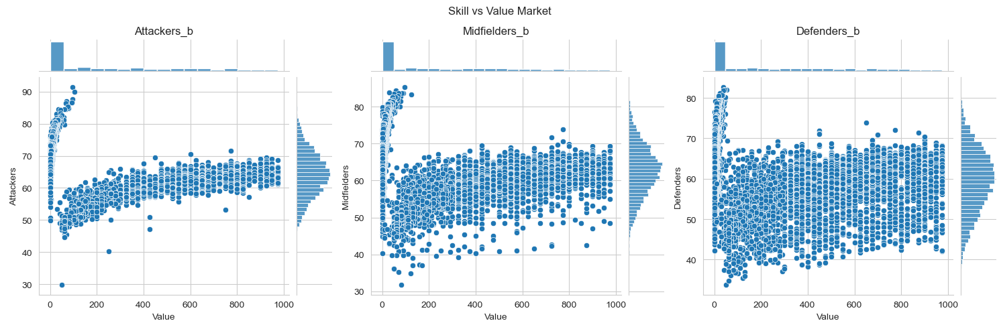

In [13]:
# A JointGrid
ScatterPlot(df)

In [14]:
df.shape

(17981, 22)

In [15]:
df=FilterPlayer(df)
df.shape

(6622, 22)

<div id="Preguntas-32" class="section level2">
<h2><span class="header-section-number">3.2</span> Atributos</h2>
<hr />
</div>

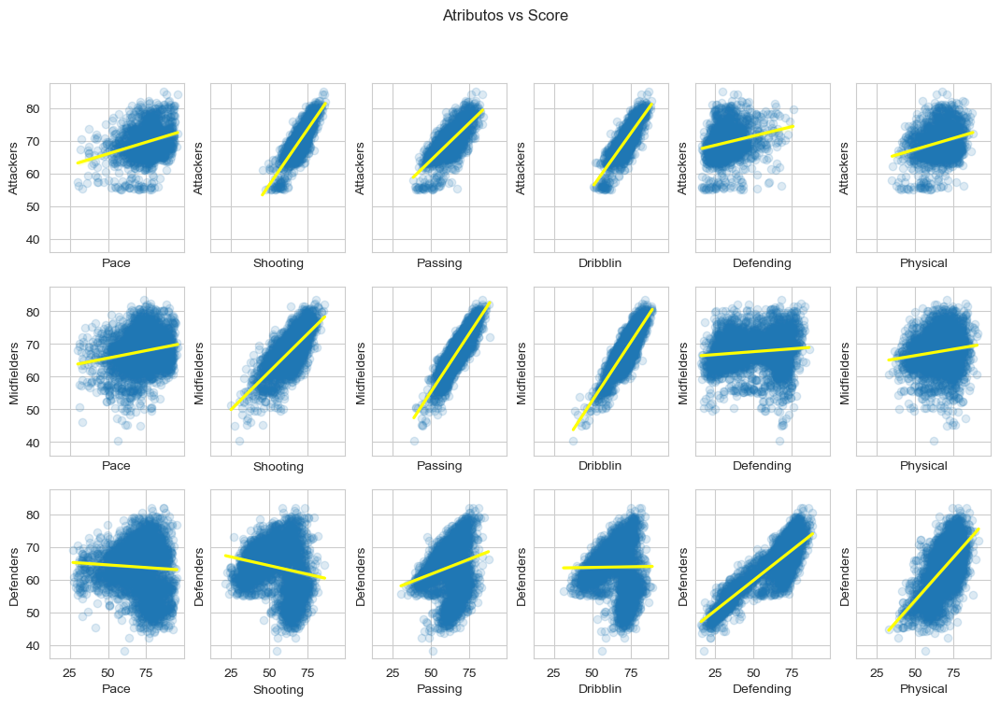

In [16]:
Weights=GetWeights(df)

In [17]:
dataframe=selection(df,Weights)

<div id="Preguntas-33" class="section level2">
<h2><span class="header-section-number">3.3</span> Edad y potencial: Age vs Score</h2>
<hr />
</div>

In [18]:
BoxIntAge(dataframe,['BoxPlot_Attack.html','BoxPlot_Miedfil.html','BoxPlot_Defen.html'])
FilGroups=AgeCut(dataframe)

<div id="Preguntas-34" class="section level2">
<h2><span class="header-section-number">3.4</span> Versatilidad</h2>
<hr />
</div>

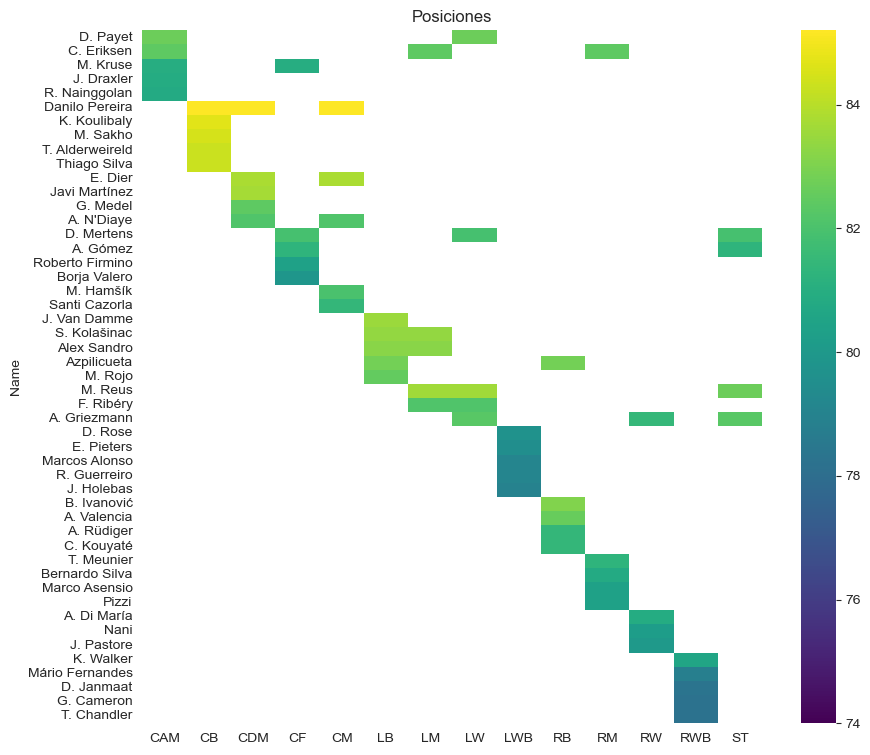

In [19]:
result=PlotPositions(FilGroups) 

<div id="Pregunta4" class="section level1">
<h1><span class="header-section-number">4.</span> Equipo Final</h1>
<hr />
</div>

In [20]:
Players={"Attackers": ["A. Griezmann" ,"M. Kruse", "M. Reus","D. Mertens"]
,"Midfielders": ["Danilo Pereira", "E. Dier", "C. Eriksen", "T. Meunier","Alex Sandro"]
,"Defenders": ["Thiago Silva","Azpilicueta", "A. Valencia", "K. Koulibaly","T. Alderweireld"]}

Team=PlayerSelect(Players)

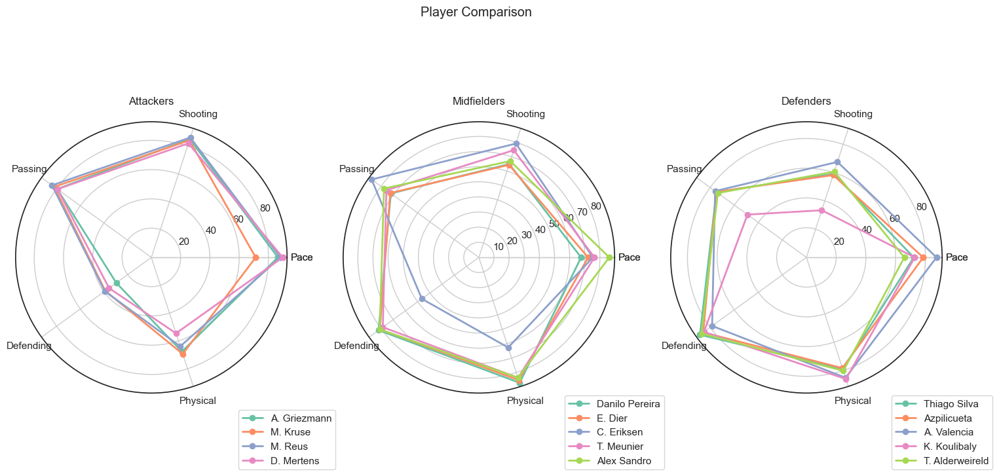

In [21]:
Comparison(Team)